In [2]:
import numpy as np
import torch
topics_train_ref = np.load('topic_distribution_results/topics_ref.npy')  # 17388 * 100
topics_train_tgt = np.load('topic_distribution_results/topics_tgts.npy') # 17388 * 10 * 100

N = 100   # topic distribution 


sample = 5000 # for train 
train_ref = topics_train_ref[:sample]  
train_tgt = topics_train_tgt[:sample]
               #  for test
test_ref = topics_train_ref[sample:2*sample]  
test_tgt = topics_train_tgt[sample:2*sample]


In [3]:
import csv
import torch
from torch import nn
import torch.nn.functional as F
from matplotlib.pyplot import figure, imshow, axis, title, scatter
from matplotlib.image import imread

# Weighted L1 
### a: anchor; p: positive; n: negative 
### loss = sum(abs(a-p)*W) - sum(abs(a-n)*W) 


In [4]:
'''4096'''
class WeightedL1(nn.Module):
    def __init__(self):
        super(WeightedL1, self).__init__() 
        self.weight = torch.ones(N, requires_grad=True)
        #self.loss_fn = nn.TripletMarginLoss(margin=1.0, p=2)
        self.optimizer = torch.optim.Adam([self.weight], lr=1e-4)
        self.loss= None
    
    def forward(self, x, y, z):
        x = self.weight * x
        y = self.weight * y
        z = self.weight * z
        return self.loss_fn(x, y, z)
    
    def loss_fn(self, x, y, z):
        margin = 1
        reg = 1e-6
        loss = torch.sum(torch.abs(x-y) - torch.abs(x-z))  + torch.dot(self.weight, self.weight) 
        return F.relu(loss)
    
    def train(self, x, y, z):
        self.loss = self.forward(x, y, z)
        self.optimizer.zero_grad()
        self.loss.backward()
        self.optimizer.step()     

In [5]:
with open('data/gt_train.csv', 'r') as f:
    reader = csv.reader(f)
    gt = [int(y) for x, y in list(reader)]

gt_train = gt[:sample]
gt_test = gt[sample:2*sample]

In [6]:
net = WeightedL1()
for epoch in range(500):
    for _ in range(sample):
        
        
        i = np.random.randint(sample)
        ind = [j for j in range(0,10) if j!=gt[i]][np.random.randint(9)]
        x = torch.from_numpy(train_ref[i]).float()
        y = torch.from_numpy(train_tgt[i][gt[i]]).float()
        z = torch.from_numpy(train_tgt[i][ind]).float()
        net.train(x,y,z)
    
    if epoch % 20 == 0:
        print('loss %2f' %net.loss)
        print('weight sum %2f'%net.weight.sum())

loss 29.432930
weight sum 54.118492
loss 0.000365
weight sum 0.000892
loss 0.000000
weight sum -0.009681
loss 0.000059
weight sum -0.001602
loss 0.000180
weight sum -0.010796
loss 0.000673
weight sum 0.006792
loss 0.000000
weight sum 0.005508
loss 0.000290
weight sum -0.000737
loss 0.000000
weight sum 0.001932
loss 0.000168
weight sum 0.002862
loss 0.000255
weight sum -0.000145
loss 0.000561
weight sum -0.005275
loss 0.000515
weight sum -0.000337
loss 0.000070
weight sum 0.008523
loss 0.000104
weight sum -0.020655
loss 0.000000
weight sum 0.000340
loss 0.000027
weight sum 0.003576
loss 0.000110
weight sum 0.011239
loss 0.000092
weight sum 0.009341
loss 0.000000
weight sum 0.012899
loss 0.000380
weight sum 0.001790
loss 0.000000
weight sum 0.005755
loss 0.000090
weight sum 0.004127
loss 0.000284
weight sum 0.004383
loss 0.000233
weight sum -0.004492


In [7]:
np.save('data/net_w.npy', net.weight.detach().numpy())

In [8]:
weight = np.load('data/net_w.npy')

In [9]:
dataset_size = sample

niv_pos_dis = np.zeros(dataset_size)
niv_neg_dis = np.zeros((dataset_size, 9))
mlr_pos_dis = np.zeros(dataset_size)
mlr_neg_dis = np.zeros((dataset_size, 9))

for i in range(dataset_size):

    niv_pos_dis[i] = sum(abs(test_ref[i] - test_tgt[i][gt_test[i]]))
    
    niv_neg_dis[i,:] = [sum(abs(test_ref[i] - test_tgt[i][j])) for j in range(0,10) if j!=gt_test[i]]
   
    mlr_pos_dis[i] = sum(weight * abs(test_ref[i] - test_tgt[i][gt_test[i]]))
    
    mlr_neg_dis[i,:] = [sum(weight*(abs(test_ref[i] - test_tgt[i][j]))) for j in range(0,10) if j!=gt_test[i]]

Accuracy:  0.0946


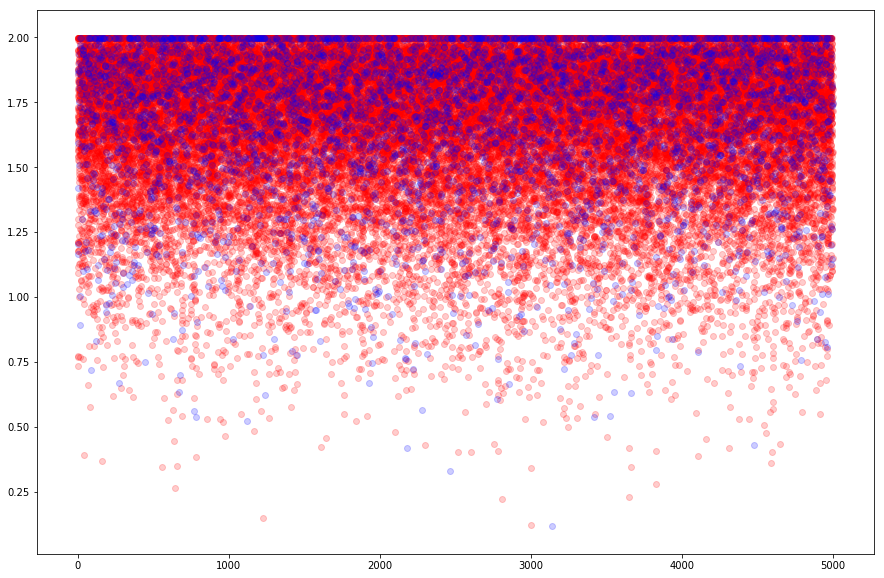

In [10]:
X = np.array([i for i in range(dataset_size)])

figure(figsize=(15,10))
for i in range(9):
    scatter(X, niv_neg_dis[:,i], c='r', alpha=0.2)
scatter(X, niv_pos_dis, c='b', alpha=0.2)

print("Accuracy: ", np.sum(niv_neg_dis.min(axis=1)>niv_pos_dis)/niv_pos_dis.shape[0])

Accuracy:  0.098


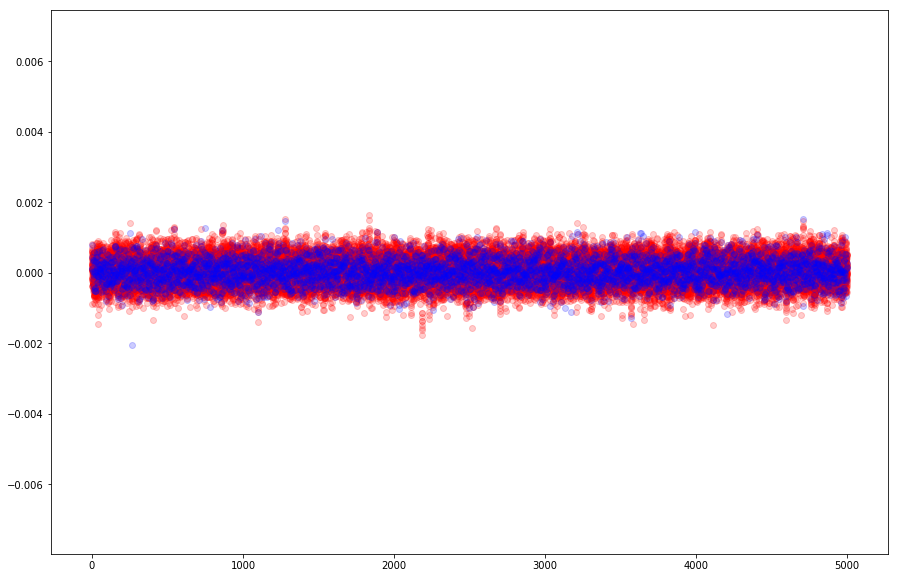

In [11]:
figure(figsize=(15,10))
for i in range(9):
    scatter(X, mlr_neg_dis[:,i], c='r', alpha=0.2)
scatter(X, mlr_pos_dis, c='b', alpha=0.2)

print("Accuracy: ", np.sum(mlr_neg_dis.min(axis=1)>mlr_pos_dis)/mlr_pos_dis.shape[0])

In [12]:
niv_ind3 = niv_neg_dis[:1000,:].argsort()[:,2]
niv_ind5 = niv_neg_dis[:1000,:].argsort()[:,4]

mlr_ind3 = mlr_neg_dis[:1000,:].argsort()[:,2]
mlr_ind5 = mlr_neg_dis[:1000,:].argsort()[:,4]

print('Naive:')
print('Top 1: ', np.sum(niv_neg_dis[:1000,:].min(axis=1)>niv_pos_dis[:1000])/1000)
print('Top 3: ', np.sum(niv_neg_dis[range(1000),niv_ind3]>niv_pos_dis[:1000])/1000)
print('Top 5: ', np.sum(niv_neg_dis[range(1000),niv_ind5]>niv_pos_dis[:1000])/1000)

print('Weighted L1:')
print('Top 1: ', np.sum(mlr_neg_dis[:1000,:].min(axis=1)>mlr_pos_dis[:1000])/1000)
print('Top 3: ', np.sum(mlr_neg_dis[range(1000),mlr_ind3]>mlr_pos_dis[:1000])/1000)
print('Top 5: ', np.sum(mlr_neg_dis[range(1000),mlr_ind5]>mlr_pos_dis[:1000])/1000)

Naive:
Top 1:  0.111
Top 3:  0.286
Top 5:  0.47
Weighted L1:
Top 1:  0.1
Top 3:  0.292
Top 5:  0.506


In [13]:
def plot_img(idx, gt, seq):
    path = 'data/task_train/' + '0' * (9 - len(str(idx))) + str(idx) + '/'
    num_of_imgs = 11
    
    fig = figure(figsize=(16,16))
    
    a=fig.add_subplot(1,num_of_imgs,1)
    image = imread(path + 'reference.jpg')
    imshow(image)
    title('Reference')
    axis('off')

    for i in range(len(seq)):
        a=fig.add_subplot(1,num_of_imgs,i+2)
        image = imread(path + 'choice_' + str(seq[i]) + '.jpg')
        imshow(image)
        if seq[i] == gt:
            title('Target')
        axis('off')

In [14]:
niv_dis_rank = np.zeros((dataset_size, 10), dtype=int)
mlr_dis_rank = np.zeros((dataset_size, 10), dtype=int)

for i in range(dataset_size):
    niv_dis_rank[i,:] = np.array([sum(abs(test_ref[i] - test_tgt[i][j])) for j in range(10)]).argsort()
   
    mlr_dis_rank[i,:] = np.array([sum(weight*(abs(test_ref[i] - test_tgt[i][j]))) for j in range(10)]).argsort()

print(niv_dis_rank[1,:])
print(mlr_dis_rank[1,:])

[5 3 2 6 9 1 0 8 4 7]
[7 5 2 0 8 3 9 4 6 1]


/Users/mac/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


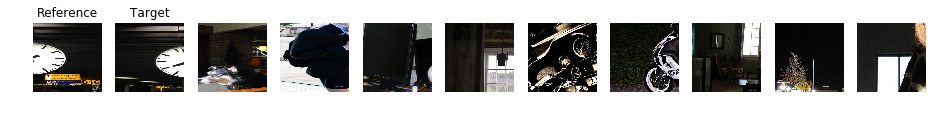

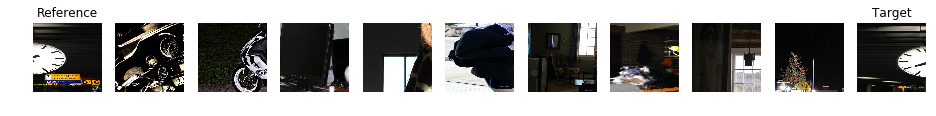

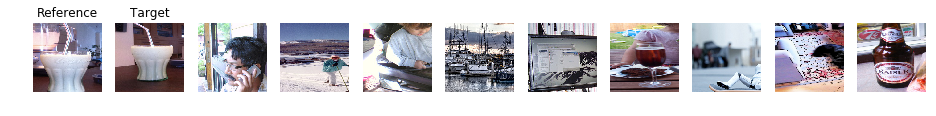

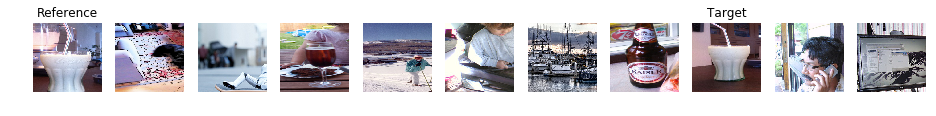

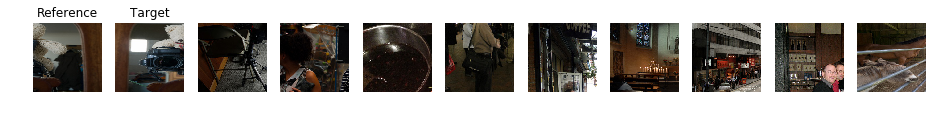

...

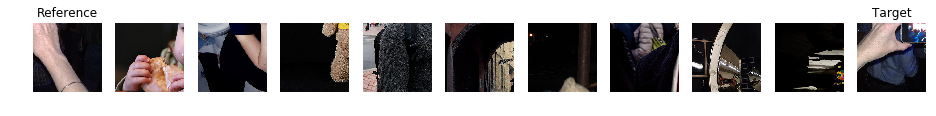

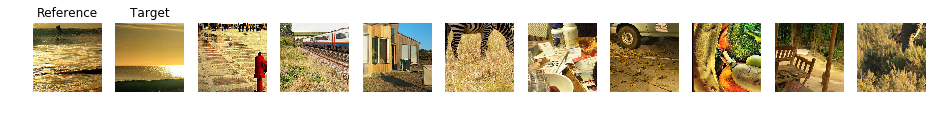

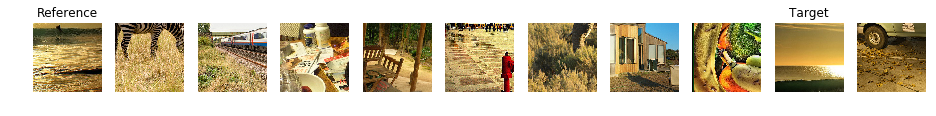

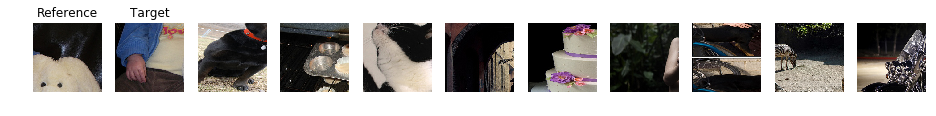

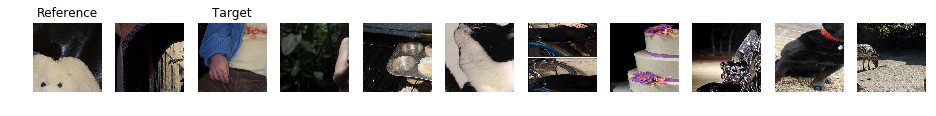

In [15]:
k = 0
while(k<20):
    i = np.random.randint(dataset_size)
    if gt_test[i]==mlr_dis_rank[i,0]:
        plot_img(i+sample, gt_test[i], mlr_dis_rank[i,:])
        plot_img(i+sample, gt_test[i], niv_dis_rank[i,:])
        k += 1
        
        

/Users/mac/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


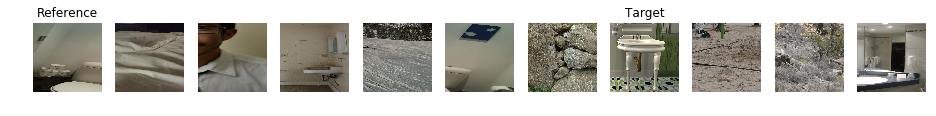

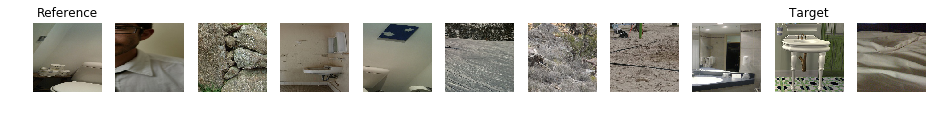

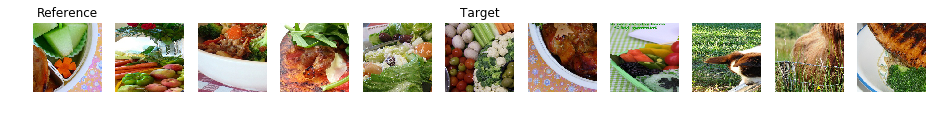

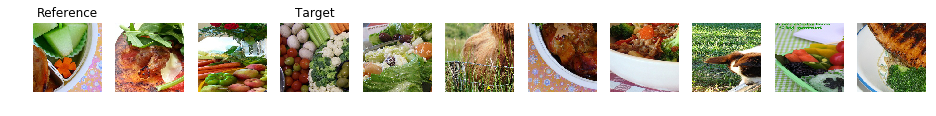

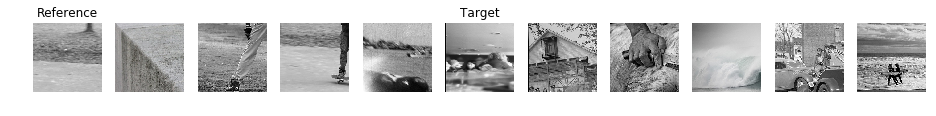

...

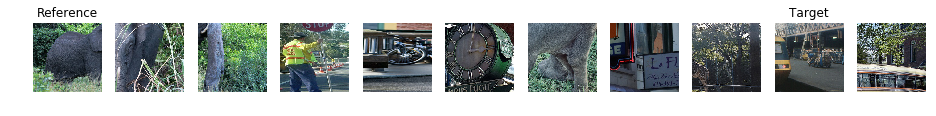

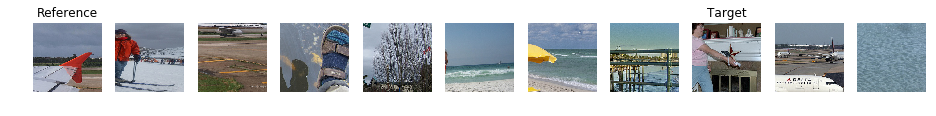

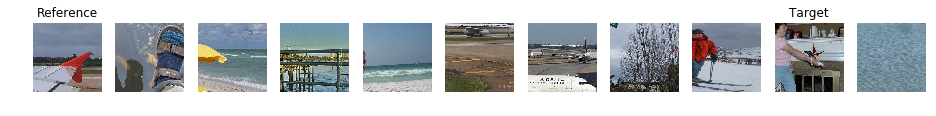

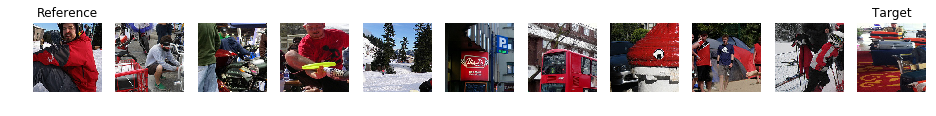

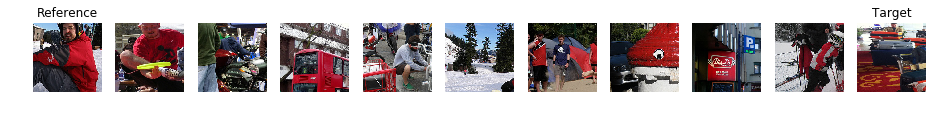

In [16]:
k = 0
while(k<20):
    i = np.random.randint(dataset_size)
    if (gt[i])!=mlr_dis_rank[i,0]:
        plot_img(i+sample, gt[i], mlr_dis_rank[i,:])
        plot_img(i+sample, gt[i], niv_dis_rank[i,:])
        k += 1